In [1]:
import sys, os, pickle

from tqdm import tqdm, trange

import numpy as np, pandas as pd
from scipy.interpolate import interp1d

from importlib import reload
sys.path.insert(1, '/mnt/home/aarora/ceph')
import compute_characteristics_ut as cc
reload(cc)
import symlib, pynbody 

import matplotlib.pyplot as plt
from matplotlib.colors import SymLogNorm, LogNorm
import cmasher as cmr
plt.style.use('dark_background')
%matplotlib inline

# Using pynbody + Full snapshot

In [2]:
sim = pynbody.load("/mnt/home/nico/ceph/symphony/MWest/Halo004/output/snapshot_235")

# convert to physical coords-> kpc, km/s, Msun based on header files
sim.physical_units()

# --- identify high-res DM by its unique (smallest) particle mass
m_dm = sim.dm['mass']
m_min = m_dm.min()
hi_mask = m_dm <= (1.1 * m_min)            # 10% tolerance around the minimum mass
hi_dm = sim.dm[hi_mask]                    # SubSnap view of high-res DM only

# Recenter on host halo
center = pynbody.analysis.halo.center(hi_dm, mode='ssc', wrap=True, return_cen=True)

In [3]:
sim.properties

{'omegaM0': 0.286,
 'omegaL0': 0.714,
 'boxsize': Unit("1.79e+05 kpc"),
 'a': 0.9999999999999996,
 'h': 0.7,
 'time': Unit("1.40e+01 kpc s km**-1")}

In [4]:
sim.properties['time'].in_units("Gyr"), pynbody.analysis.cosmology.age(sim)

(13.64748518544324, 13.64748518544324)

In [22]:
pos = np.asarray(hi_dm['pos'] - center)
mass = np.array(hi_dm['mass'])

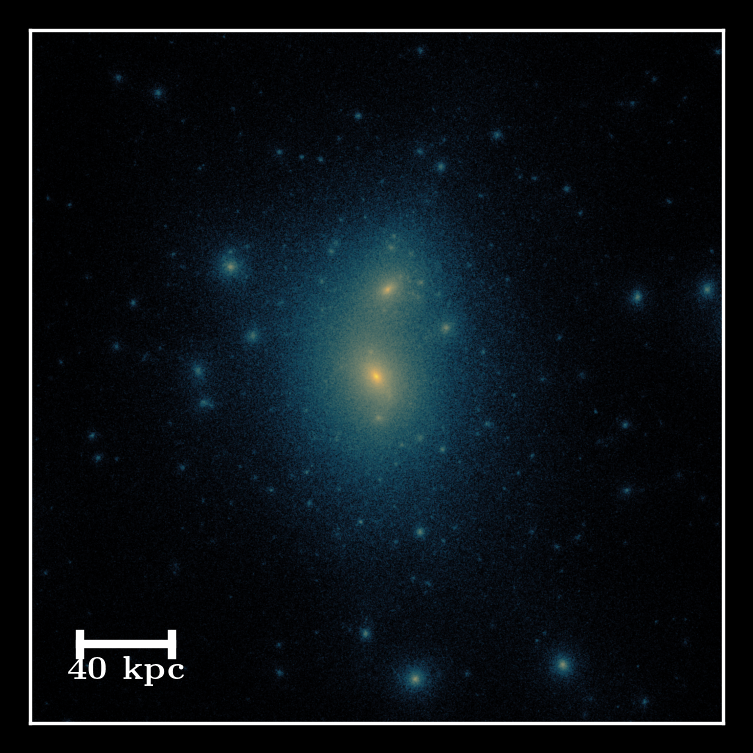

In [23]:
cc.projected_density_image(
    pos=pos, mass=mass, grid_len=150, 
    colorbar_ax=False,
    scale_size=40, vmin=6.5, vmax=9,
    density_kind="Volume", slice_width=1,
)

In [7]:
# # Let's compute the dens profile
rad, den = cc.empirical_density_profile(pos, mass, rmax=600, rmin=0.25, nbins=50)

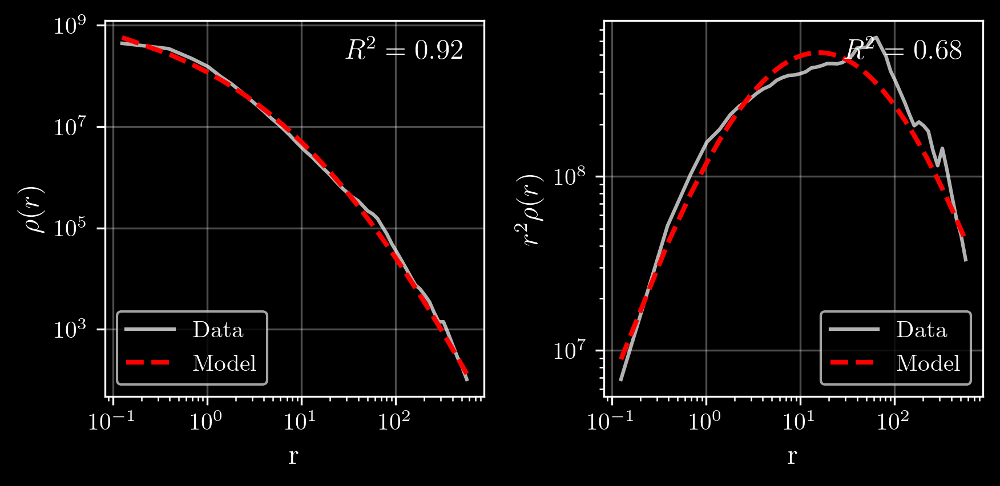

(np.float64(1627127042590.7778),
 np.float64(19.56873946039543),
 np.float64(0.4397651702556767),
 np.float64(3.9888782001882976),
 np.float64(0.1894666924390103))

In [8]:
cc.fit_double_spheroid_profile(r_centers=rad, rho_vals=den, weighting='inverse_sqrt', plot_results=True)

# Using SymLib

In [9]:
sim_dir = symlib.get_host_directory("/mnt/home/aarora/ceph/Symphony/data/", "MWest", "Halo004")
# sim_dir = f'/mnt/home/nico/ceph/symphony/Halo004-CDM/'
part = symlib.Particles(sim_dir, include=["E_sph"]) ## for nonMW there is just E. E_sph/E in subhalo ref frame. E>0 unbound.

In [10]:
p = part.read(235)

In [11]:
def return_bound_paricle_ids(p, subhalo_index, E_key='E_sph'):
    is_bound = (p[subhalo_index][E_key] < 0)
    return p[subhalo_index]['id'][is_bound]

def indices_to_keep(particle_ids_host, particle_id_tobeRemoved):
    """
    Return integer indices (into particle_ids_host) for elements NOT in particle_id_tobeRemoved.
    Preserves the order of particle_ids_host. Safe: avoids out-of-bounds when using searchsorted.
    """
    host = np.asarray(particle_ids_host)
    removed = np.asarray(particle_id_tobeRemoved)

    if host.size == 0:
        return np.array([], dtype=int)
    if removed.size == 0:
        return np.arange(host.size, dtype=int)

    # ensure comparable dtypes
    if host.dtype != removed.dtype:
        try:
            removed = removed.astype(host.dtype, copy=False)
        except Exception:
            host = host.astype(removed.dtype, copy=False)

    # unique+sort the removed list (smaller & faster comparisons)
    removed_sorted = np.sort(np.unique(removed))

    # binary-search each host id in the small removed_sorted array
    idx = np.searchsorted(removed_sorted, host)

    # SAFE check: only index removed_sorted where idx is in-bounds
    found = np.zeros(host.shape, dtype=bool)
    mask_valid = idx < removed_sorted.size
    if mask_valid.any():
        found[mask_valid] = removed_sorted[idx[mask_valid]] == host[mask_valid]

    keep_mask = ~found
    return np.nonzero(keep_mask)[0]


# # particles ids associated with the LMC throughout history/current step.
particle_id_LMC          = p[1]['id']
particle_id_bound_struct = np.hstack([return_bound_paricle_ids(p, subhalo_index) for subhalo_index in trange(2, len(p))])
to_remove_id             = np.unique(np.hstack([particle_id_LMC, particle_id_bound_struct]))

# # particles ids that are associated with the main branch
host_keep_idx = indices_to_keep(p[0]['id'], to_remove_id)

100%|██████████| 427/427 [00:00<00:00, 32953.70it/s]


In [18]:
# s, hist = symlib.read_symfind(sim_dir)

In [12]:
param = symlib.simulation_parameters(sim_dir) # or part.params
mass_dm = param["mp"]/param["h100"] # Msun physical

# pos, vel = p[0]["x"][is_smooth], p[0]["v"][is_smooth] ## 0 is the main host in each snapshot. 
pos, vel = p[0]["x"], p[0]["v"] ## 0 is the main host in each snapshot. 

## Only smooth stuff

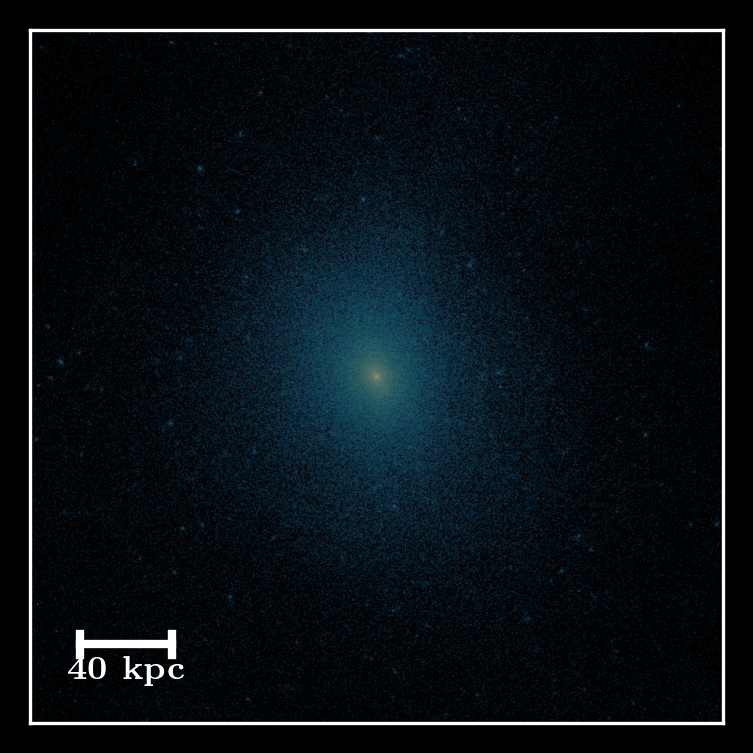

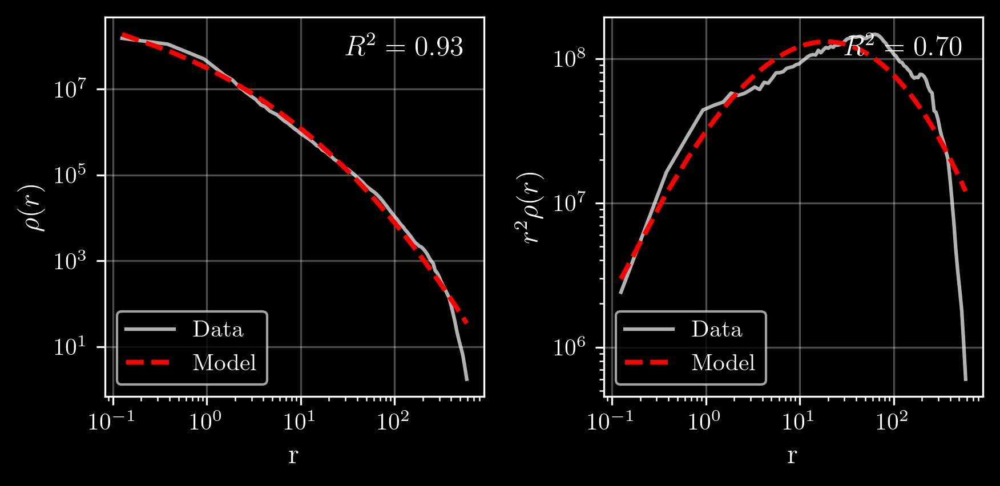

(np.float64(420306193004.4902),
 np.float64(518.9649936579234),
 np.float64(0.2637520276872432),
 np.float64(6.771494631777265),
 np.float64(0.0))

In [13]:
vmin, vmax, scale_size = 6, 10, 40
is_smooth = p[0]["smooth"] ## particles that are accreted smoothly 
pos_smooth = p[0]["x"][is_smooth]

cc.projected_density_image(
    pos=pos_smooth, mass=mass_dm, grid_len=150, 
    colorbar_ax=False, 
    scale_size=scale_size, vmin=vmin, vmax=vmax,
    density_kind="surface", #slice_width=1,
)
# # Let's compute the dens profile
rad, den = cc.empirical_density_profile(pos_smooth, mass_dm, rmax=600, rmin=0.25, nbins=100)
cc.fit_double_spheroid_profile(r_centers=rad, rho_vals=den, weighting='inverse_sqrt', plot_results=True)
# cc.fit_double_spheroid_profile(positions=pos, masses=mass_dm, bins=100, weighting='inverse_sqrt', plot_results=True)

## Current - substructure

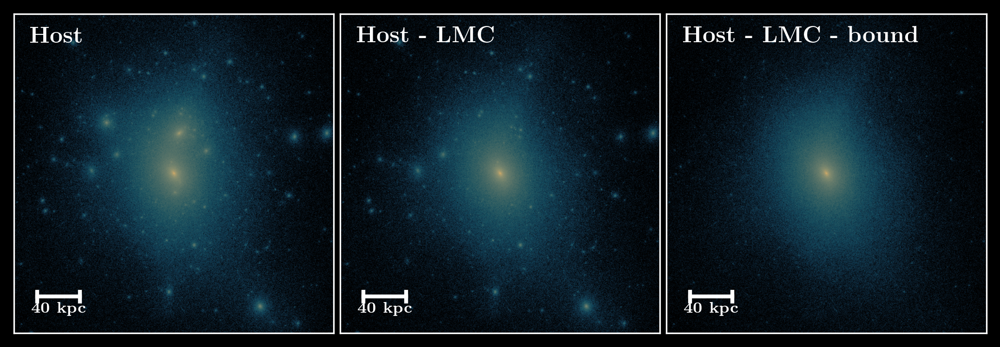

In [14]:
fig, ax = plt.subplots(1, 3, figsize=(9, 3), dpi=300, sharex=True, sharey=True)
plt.subplots_adjust(wspace=0.02)

vmin, vmax, scale_size = 6, 10, 40

cc.projected_density_image(
    pos=pos, mass=mass_dm, grid_len=150, 
    colorbar_ax=False, ax=ax[0],
    scale_size=scale_size, vmin=vmin, vmax=vmax,
    density_kind="surface", #slice_width=1,
)

cc.projected_density_image(
    pos=pos[indices_to_keep(p[0]['id'], particle_id_LMC)], mass=mass_dm, grid_len=150, 
    colorbar_ax=False, ax=ax[1],
    scale_size=scale_size, vmin=vmin, vmax=vmax,
    density_kind="surface", #slice_width=1,
)


cc.projected_density_image(
    pos=pos[host_keep_idx], mass=mass_dm, grid_len=150, 
    colorbar_ax=False, ax=ax[2],
    scale_size=scale_size, vmin=vmin, vmax=vmax,
    density_kind="surface", #slice_width=1,
)

ax[0].annotate(r'\bf{Host}', xy=(0.05, 0.96), 
               xycoords='axes fraction', ha='left', va='top');

ax[1].annotate(r'\bf{Host - LMC}', xy=(0.05, 0.96), 
               xycoords='axes fraction', ha='left', va='top');

ax[2].annotate(r'\bf{Host - LMC - bound}', xy=(0.05, 0.96), 
               xycoords='axes fraction', ha='left', va='top');

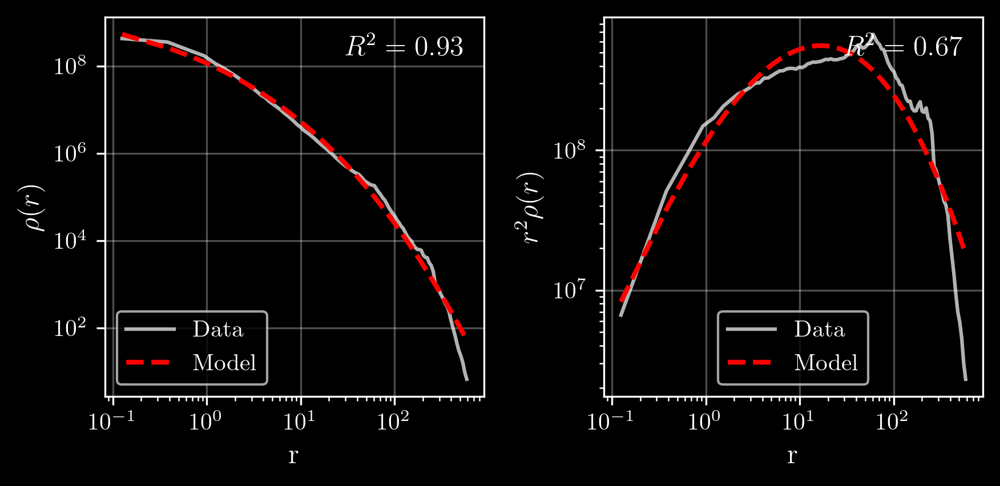

(np.float64(1032805147919.2272),
 np.float64(585.8964491448086),
 np.float64(0.31196247606145217),
 np.float64(8.06125335190364),
 np.float64(0.0))

In [15]:
# # Let's compute the dens profile
rad, den = cc.empirical_density_profile(pos, mass_dm, rmax=600, rmin=0.25, nbins=100)
cc.fit_double_spheroid_profile(r_centers=rad, rho_vals=den, weighting='inverse_sqrt', plot_results=True)
# cc.fit_double_spheroid_profile(positions=pos, masses=mass_dm, bins=100, weighting='inverse_sqrt', plot_results=True)

# Filtering out halo IDS from the entire Gadget-2 snapshot

In [151]:
s, hist = symlib.read_symfind(sim_dir)
r, _ = symlib.read_rockstar(sim_dir)

In [152]:
r[0, 235]['rvir']

np.float32(263.32767)

In [24]:
pos = np.asarray(hi_dm['pos'] - center)
mass = np.array(hi_dm['mass'])

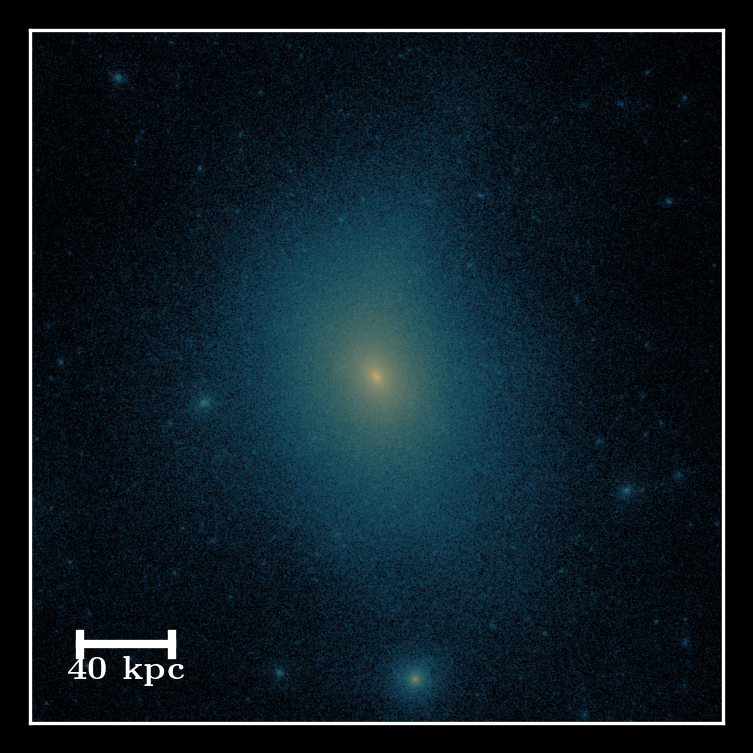

In [25]:
cc.projected_density_image(
    pos=pos[indices_to_keep(hi_dm['iord'], to_remove_id)], mass=mass_dm, grid_len=150, 
    colorbar_ax=False,
    scale_size=scale_size, vmin=vmin, vmax=vmax,
    density_kind="surface", #slice_width=5,
)

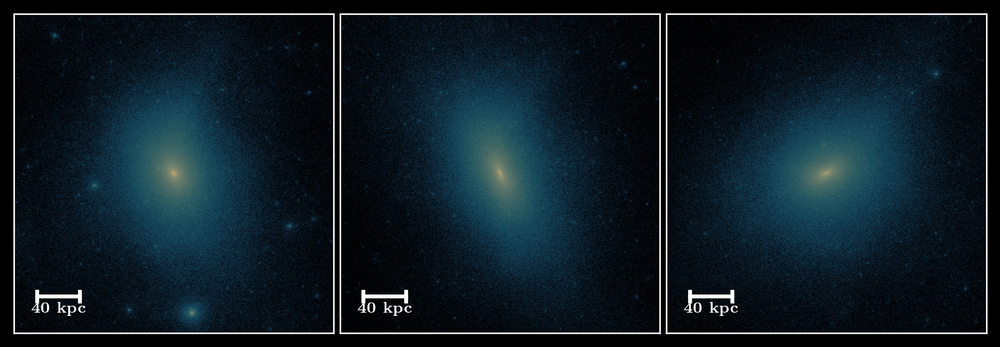

In [26]:
fig, ax = plt.subplots(1, 3, figsize=(9, 3), dpi=300, sharex=True, sharey=True)
plt.subplots_adjust(wspace=0.02)

cc.projected_density_image(
    pos=pos[indices_to_keep(hi_dm['iord'], to_remove_id)], mass=mass_dm, grid_len=150, 
    colorbar_ax=False, ax=ax[0],
    scale_size=scale_size, vmin=vmin, vmax=vmax,
    density_kind="surface", #slice_width=5,
)

cc.projected_density_image(
    pos=pos[indices_to_keep(hi_dm['iord'], to_remove_id)], mass=mass_dm, grid_len=150, 
    colorbar_ax=False, ax=ax[1], yval='Y',
    scale_size=scale_size, vmin=vmin, vmax=vmax,
    density_kind="surface", #slice_width=5,
)

cc.projected_density_image(
    pos=pos[indices_to_keep(hi_dm['iord'], to_remove_id)], mass=mass_dm, grid_len=150, 
    colorbar_ax=False, ax=ax[2], xval='Y', yval='Z',
    scale_size=scale_size, vmin=vmin, vmax=vmax,
    density_kind="surface", #slice_width=5,
)

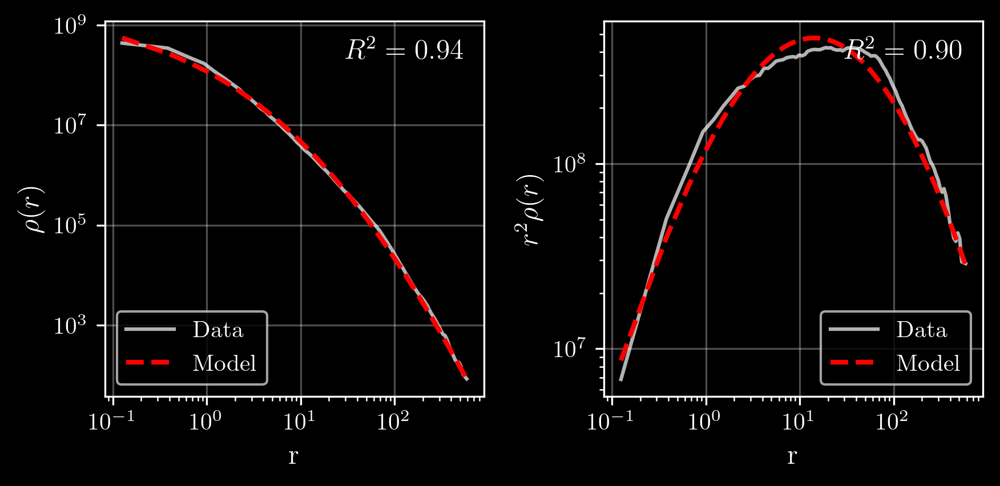

(np.float64(1172580699156.1167),
 np.float64(24.75960422886786),
 np.float64(0.38389833702649023),
 np.float64(4.467129502982141),
 np.float64(0.0))

In [127]:
# # Let's compute the dens profile
rad, den = cc.empirical_density_profile(pos[indices_to_keep(hi_dm['iord'], to_remove_id)], mass_dm, rmax=600, rmin=0.25, nbins=100)
cc.fit_double_spheroid_profile(r_centers=rad, rho_vals=den, weighting='inverse_sqrt', plot_results=True)
# cc.fit_double_spheroid_profile(positions=pos, masses=mass_dm, bins=100, weighting='inverse_sqrt', plot_results=True)

In [128]:
import pygadgetreader as pygr
snap = pygr.readsnap("/mnt/home/nico/ceph/symphony/MWest/Halo004/output/snapshot_235", 'pid', 'dm')

Returning DM    Particle IDs


In [129]:
snap

array([1453568, 1334784, 1334528, ...,  141053,   81661,   22269],
      shape=(19836928,), dtype=uint32)

In [132]:
hi_dm['iord']

SimArray([1453568, 1334784, 1334528, ...,  141053,   81661,   22269],
         shape=(19836928,), dtype=int32)

In [131]:
19836928/36551900

0.5427057964155078

In [13]:
176091152/1e8

1.76091152

In [8]:
sim.properties

{'omegaM0': 0.286,
 'omegaL0': 0.714,
 'boxsize': Unit("1.79e+05 kpc"),
 'a': 0.9999999999999996,
 'h': 0.7,
 'time': Unit("1.40e+01 kpc s km**-1")}

In [34]:
# # # reading particle data
# sim_dir = symlib.get_host_directory(
# "/mnt/home/nico/ceph/symphony/", "MWest", "Halo004")

# # Read header data needed to fast particle reads
# part = symlib.read_rockstar(sim_dir)

# # Read particle data for snapshot 199
# # p = part.read(235)

FileNotFoundError: [Errno 2] No such file or directory: '/mnt/home/nico/ceph/symphony/MWest/Halo004/halos/subhalos.dat'

In [30]:
params = symlib.simulation_parameters(sim_dir)
print(params)

{'flat': True, 'H0': 70.0, 'Om0': 0.286, 'Ob0': 0.049, 'sigma8': 0.82, 'ns': 0.95, 'eps': 0.17, 'mp': 281981.0, 'h100': 0.7}


In [31]:
sim_dir

'/mnt/home/nico/ceph/symphony/MWest/Halo004'